In [68]:
import open3d as o3d
import numpy as np
import glob
import os
import matplotlib.pyplot as plt 
import cv2

In [80]:
pcd = o3d.io.read_point_cloud(r"CV-A2-calibration\lidar_scans\frame_1473.pcd")
pcd_points = np.asarray(pcd.points)
o3d.visualization.draw_geometries([pcd])

[Open3D WARNING] GLFW Error: WGL: Failed to make context current: The handle is invalid. 


In [2]:
pcd_list = glob.glob('CV-A2-calibration\lidar_scans\*.pcd')
pcd_list = sorted(pcd_list)
print(pcd_list)

['CV-A2-calibration\\lidar_scans\\frame_1061.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1075.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1093.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1139.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1153.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1163.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1195.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1366.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1430.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1473.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1558.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1580.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1638.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1698.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1725.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1798.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1816.pcd', 'CV-A2-calibration\\lidar_scans\\frame_1850.pcd', 'CV-A2-calibration\\lidar_scans\\frame_2030.pcd', 'CV-A2-calibration\\lidar_scans\\frame_2107.pcd',

In [6]:
normal_list = []
offset_list = []

for path in pcd_list:
    pcd = o3d.io.read_point_cloud(path)
    points = np.asarray(pcd.points)
    centroid = np.mean(points, axis=0)
    _, _, V = np.linalg.svd(points)
    normal = V[-1]
    offset = -np.dot(normal, centroid)
    normal_list.append(normal)
    offset_list.append(offset)

# print(np.array(normal_list).shape)

(38, 3)


In [3]:
parameter_list = glob.glob('CV-A2-calibration\camera_parameters\*.jpeg')
parameter_list = sorted(parameter_list)
print(parameter_list)

['CV-A2-calibration\\camera_parameters\\frame_1061.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1075.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1093.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1139.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1153.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1163.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1195.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1366.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1430.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1473.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1558.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1580.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1638.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1698.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1725.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1798.jpeg', 'CV-A2-calibration\\camera_parameters\\frame_1816.jpeg', 'CV-A2-calibration\\camera_par

In [4]:
camera_normal_list = []

for path in parameter_list:
    normal_path = f"{path}\\camera_normals.txt"
    with open(normal_path,'r') as f:
        temp = []
        for line in f:
            temp.append(eval(line.strip()))
    camera_normal_list.append(temp)
print(np.array(camera_normal_list).shape)

(38, 3)


In [44]:
## to calculate translation matrix we first get the normal with respect to camera
thetac = np.array(camera_normal_list)
temp = thetac.T @ thetac
temp_inv = np.linalg.inv(temp)
temp2 = temp_inv @ thetac.T
translation_matrix = -1*(temp2 @ np.array(offset_list))
print(translation_matrix)
translation_matrix = translation_matrix.reshape((3,1))

[ 0.00035685  0.00201966 -0.00026296]


In [35]:
## to calculate rotation matrix we do
temp = thetac.T @ np.array(normal_list)
U, S, V = np.linalg.svd(temp)
rotation_matrix = -1*(V.T @ U.T)
print(rotation_matrix.shape)
print(np.linalg.det(rotation_matrix))

(3, 3)
1.0


In [48]:
intrinsic_parameter = np.array([[6.353664855742439386e+02, 0.000000000000000000e+00, 6.433965876009681324e+02],
                       [0.000000000000000000e+00, 6.261901730718112731e+02, 3.880747880982142988e+02],
                       [0.000000000000000000e+00, 0.000000000000000000e+00, 1.000000000000000000e+00]])

In [57]:
for i, path in enumerate(pcd_list):
    img_name = parameter_list[i].split("\\")[-1]
    print(img_name)
    pcd = o3d.io.read_point_cloud(path)
    points = np.asarray(pcd.points)
    camera_points = []
    for point in points:
        temp = point @ rotation_matrix + translation_matrix
        camera_points.append(temp)
    break

frame_1061.jpeg


CV-A2-calibration\camera_parameters\frame_1061.jpeg
frame_1061.jpeg
(230, 1, 2)


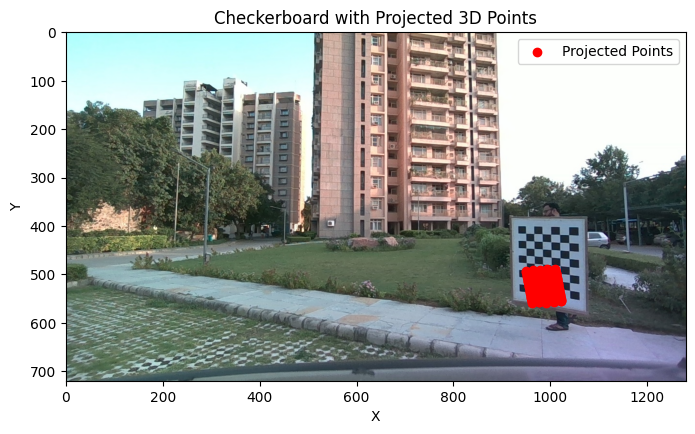

CV-A2-calibration\camera_parameters\frame_1075.jpeg
frame_1075.jpeg
(153, 1, 2)


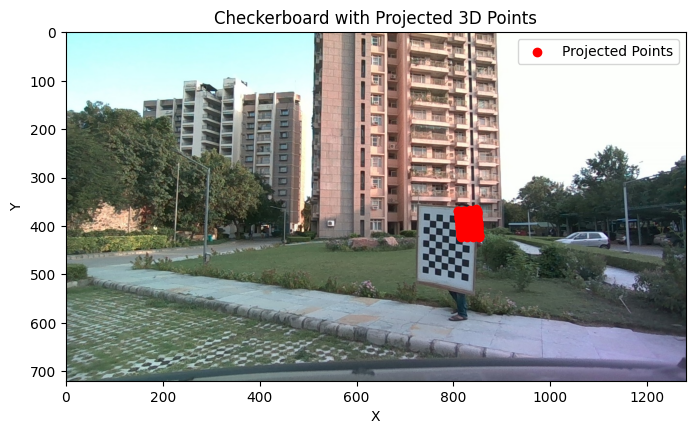

CV-A2-calibration\camera_parameters\frame_1093.jpeg
frame_1093.jpeg
(116, 1, 2)


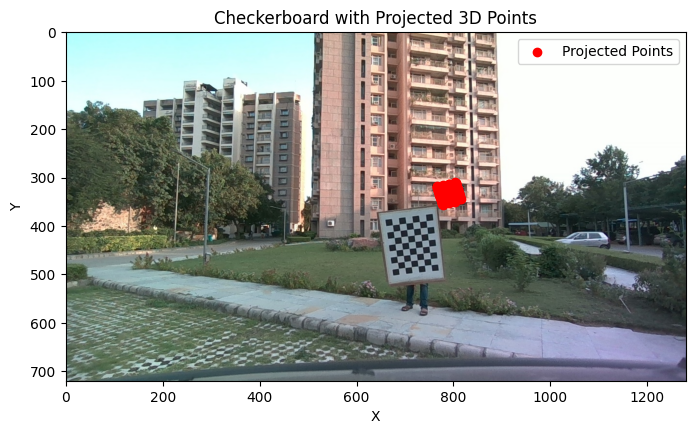

CV-A2-calibration\camera_parameters\frame_1139.jpeg
frame_1139.jpeg
(143, 1, 2)


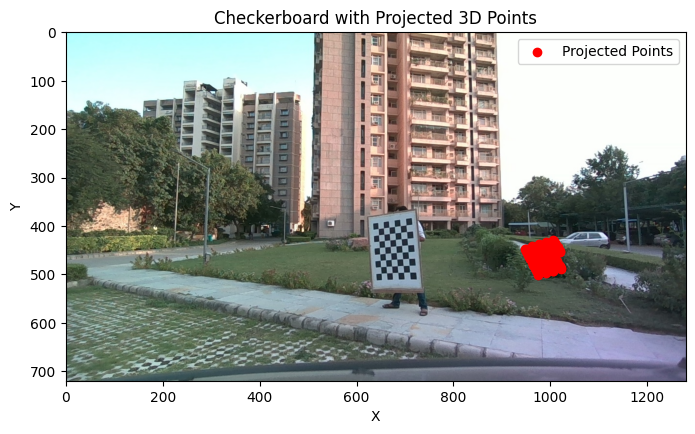

CV-A2-calibration\camera_parameters\frame_1153.jpeg
frame_1153.jpeg
(107, 1, 2)


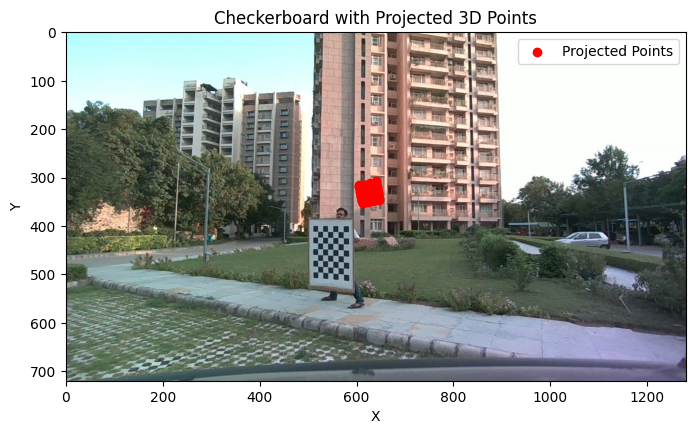

CV-A2-calibration\camera_parameters\frame_1163.jpeg
frame_1163.jpeg
(91, 1, 2)


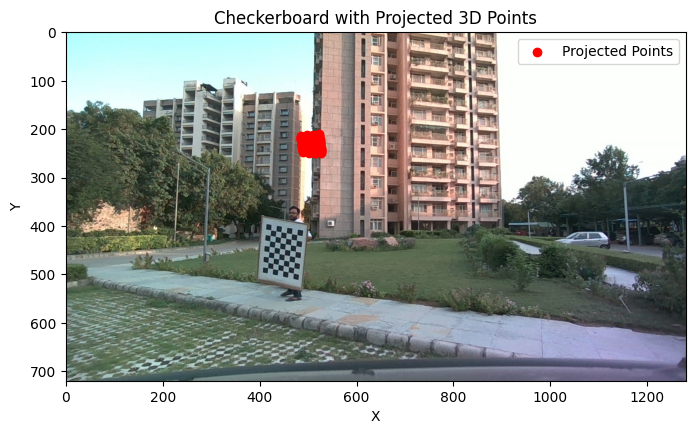

CV-A2-calibration\camera_parameters\frame_1195.jpeg
frame_1195.jpeg
(93, 1, 2)


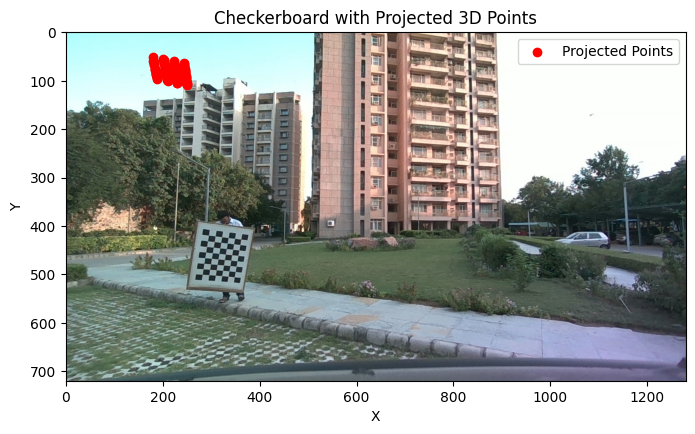

CV-A2-calibration\camera_parameters\frame_1366.jpeg
frame_1366.jpeg
(92, 1, 2)


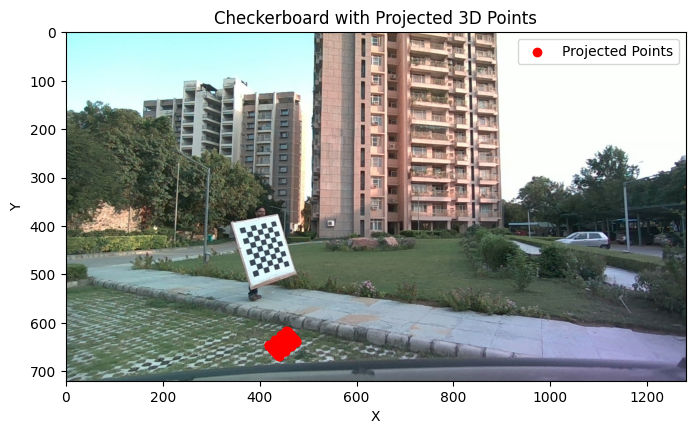

CV-A2-calibration\camera_parameters\frame_1430.jpeg
frame_1430.jpeg
(104, 1, 2)


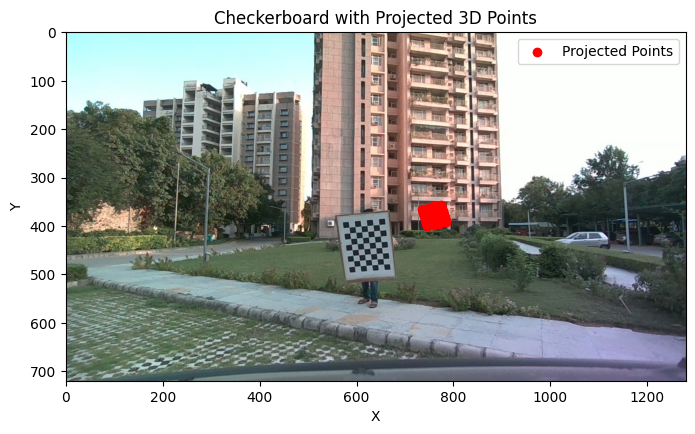

CV-A2-calibration\camera_parameters\frame_1473.jpeg
frame_1473.jpeg
(110, 1, 2)


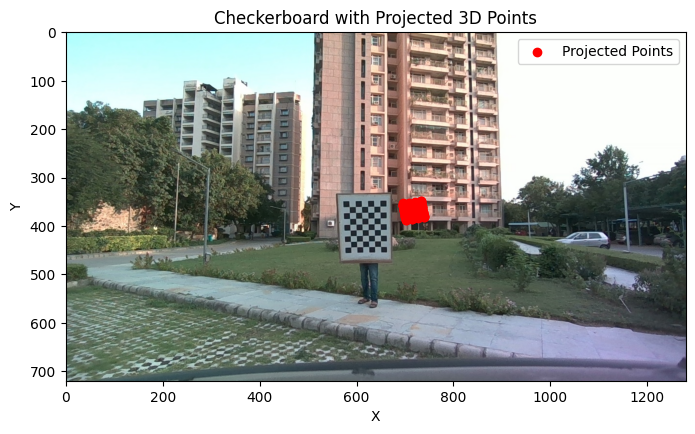

CV-A2-calibration\camera_parameters\frame_1558.jpeg
frame_1558.jpeg
(167, 1, 2)


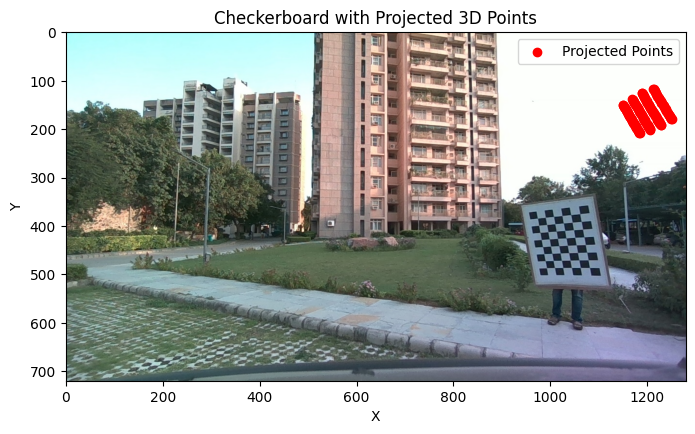

CV-A2-calibration\camera_parameters\frame_1580.jpeg
frame_1580.jpeg
(150, 1, 2)


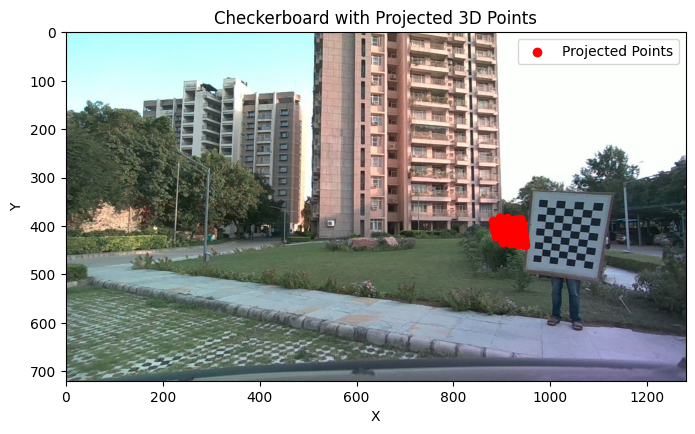

CV-A2-calibration\camera_parameters\frame_1638.jpeg
frame_1638.jpeg
(173, 1, 2)


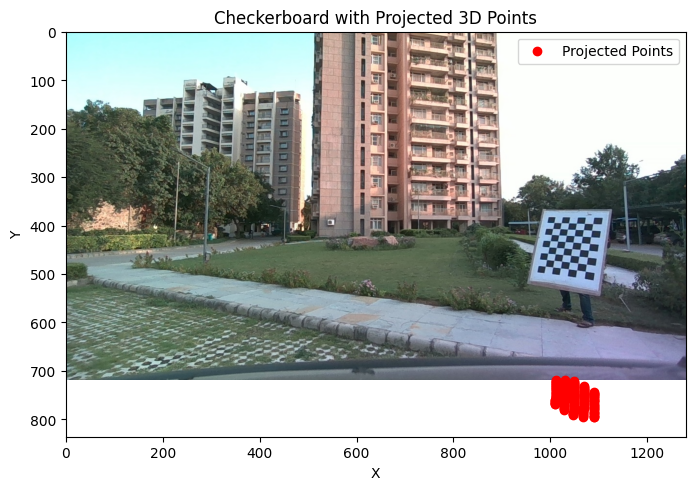

CV-A2-calibration\camera_parameters\frame_1698.jpeg
frame_1698.jpeg
(109, 1, 2)


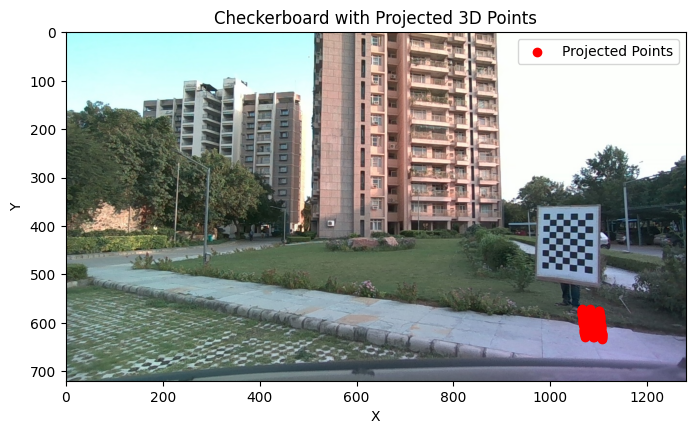

CV-A2-calibration\camera_parameters\frame_1725.jpeg
frame_1725.jpeg
(113, 1, 2)


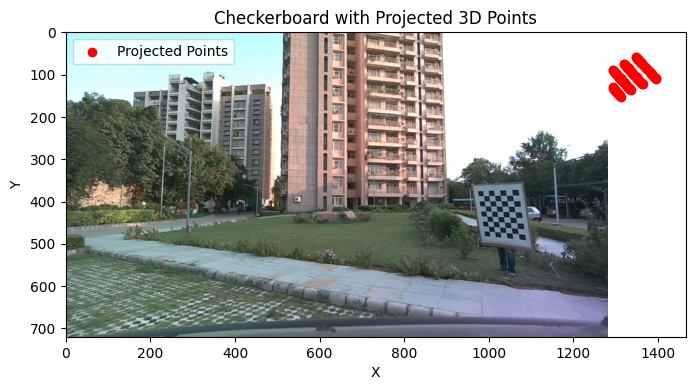

CV-A2-calibration\camera_parameters\frame_1798.jpeg
frame_1798.jpeg
(60, 1, 2)


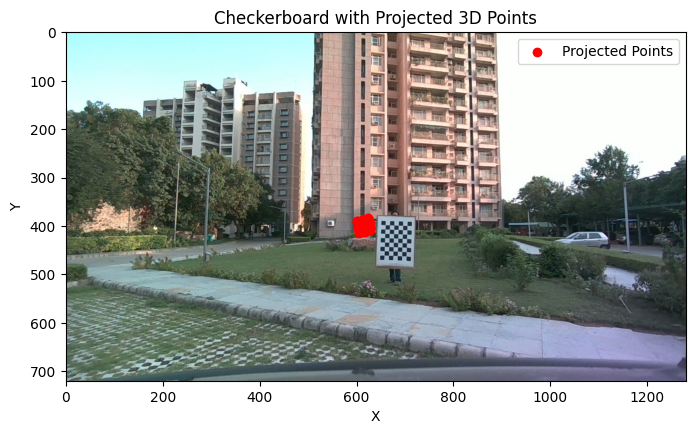

CV-A2-calibration\camera_parameters\frame_1816.jpeg
frame_1816.jpeg
(61, 1, 2)


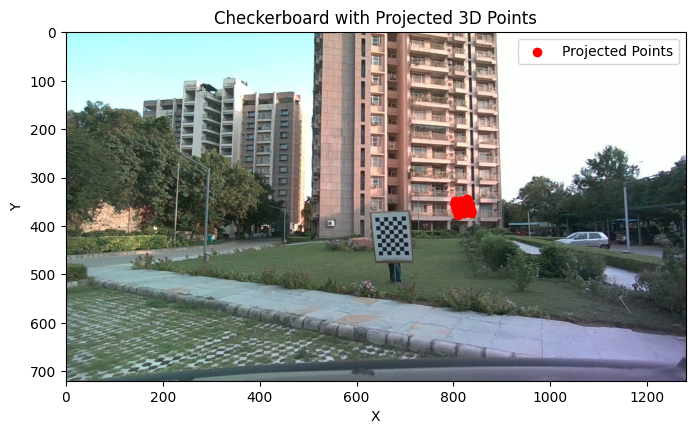

CV-A2-calibration\camera_parameters\frame_1850.jpeg
frame_1850.jpeg
(86, 1, 2)


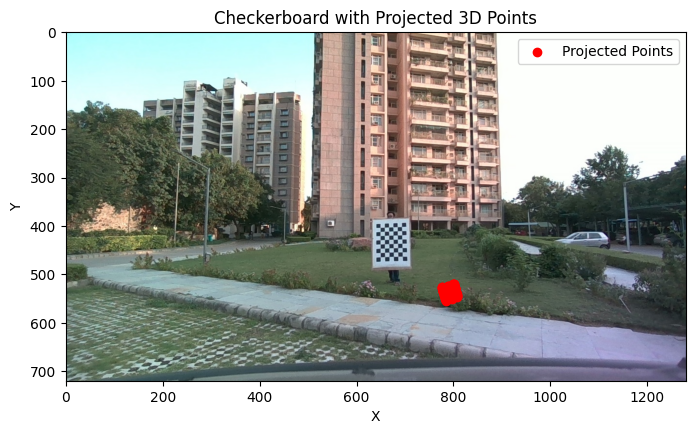

CV-A2-calibration\camera_parameters\frame_2030.jpeg
frame_2030.jpeg
(42, 1, 2)


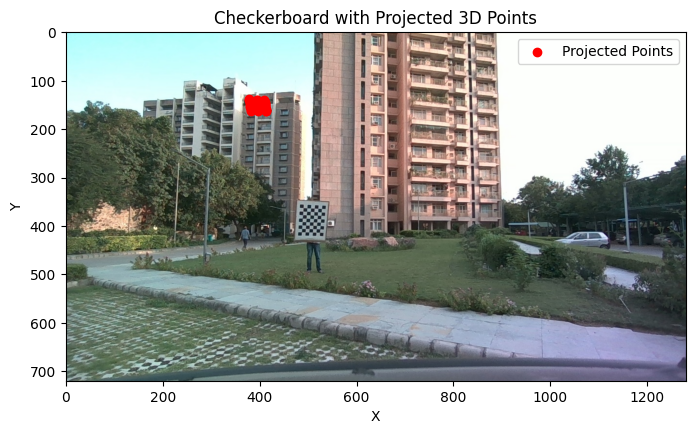

CV-A2-calibration\camera_parameters\frame_2107.jpeg
frame_2107.jpeg
(42, 1, 2)


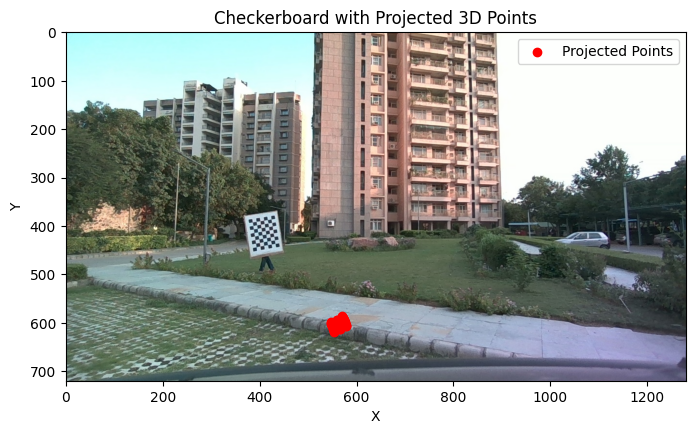

CV-A2-calibration\camera_parameters\frame_256.jpeg
frame_256.jpeg
(55, 1, 2)


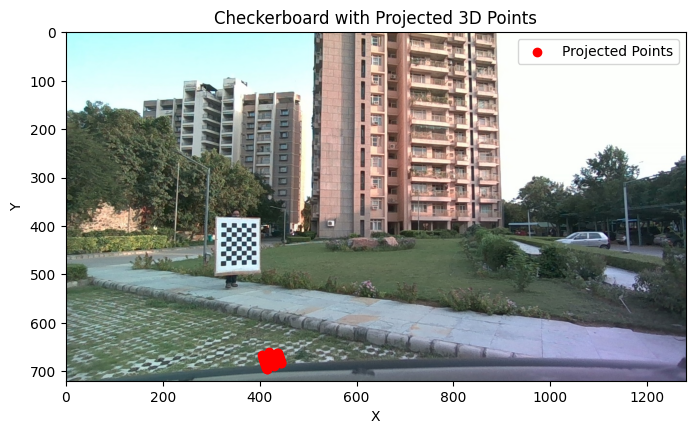

CV-A2-calibration\camera_parameters\frame_2717.jpeg
frame_2717.jpeg
(44, 1, 2)


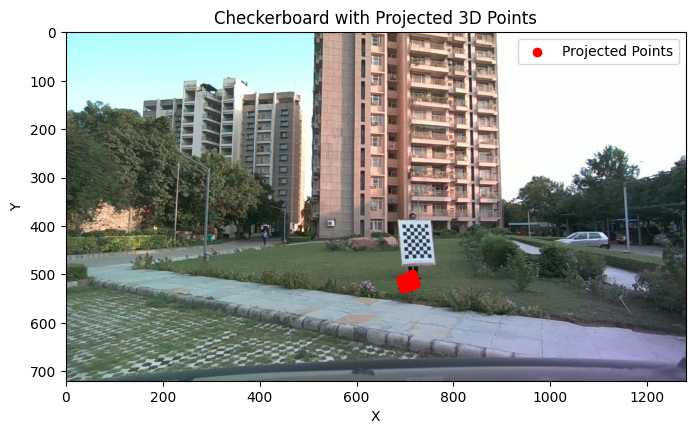

CV-A2-calibration\camera_parameters\frame_2725.jpeg
frame_2725.jpeg
(41, 1, 2)


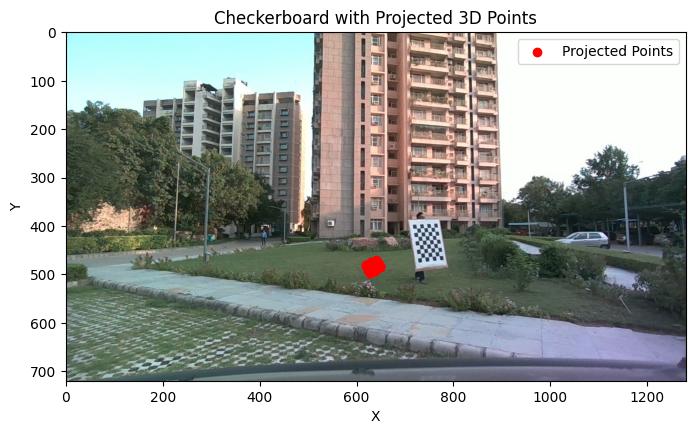

CV-A2-calibration\camera_parameters\frame_2771.jpeg
frame_2771.jpeg
(63, 1, 2)


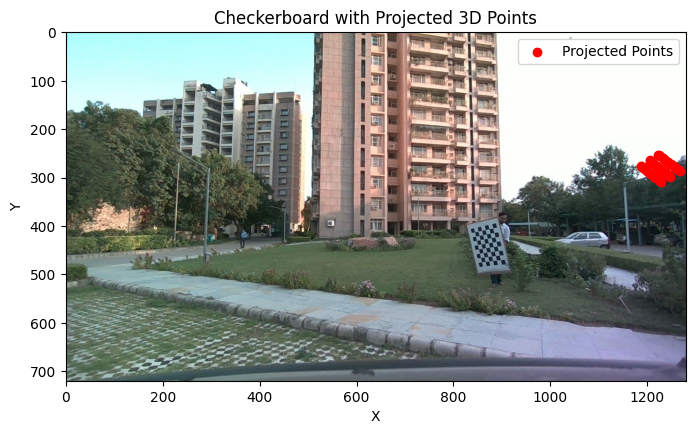

CV-A2-calibration\camera_parameters\frame_2800.jpeg
frame_2800.jpeg
(86, 1, 2)


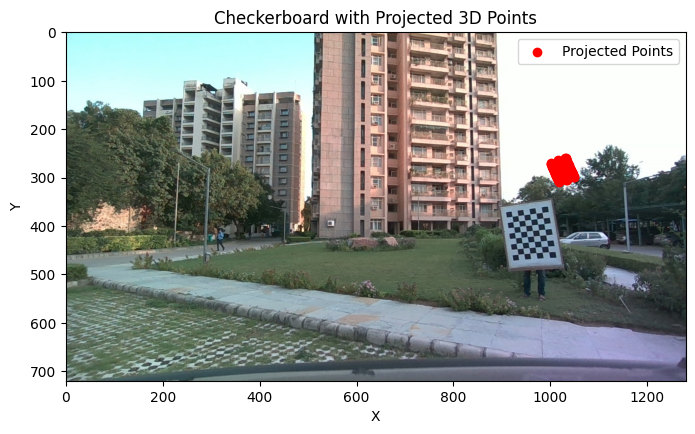

CV-A2-calibration\camera_parameters\frame_2822.jpeg
frame_2822.jpeg
(101, 1, 2)


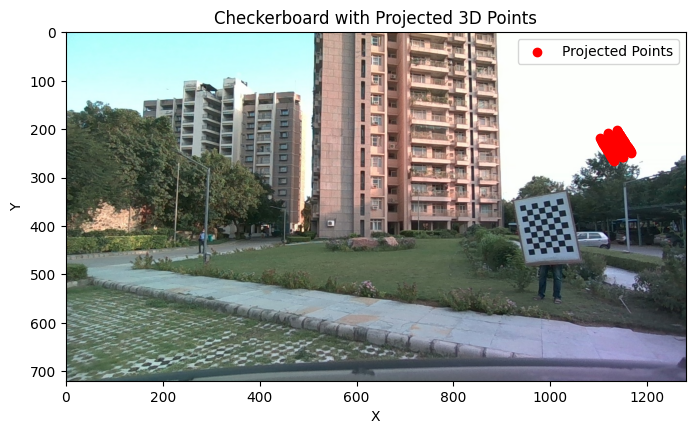

CV-A2-calibration\camera_parameters\frame_2962.jpeg
frame_2962.jpeg
(215, 1, 2)


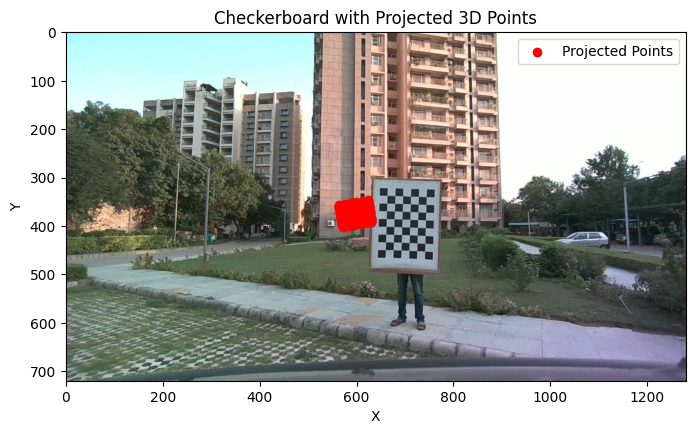

CV-A2-calibration\camera_parameters\frame_2991.jpeg
frame_2991.jpeg
(166, 1, 2)


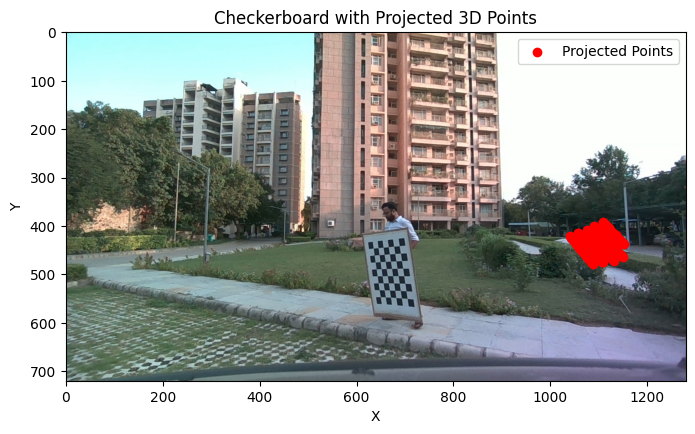

CV-A2-calibration\camera_parameters\frame_3329.jpeg
frame_3329.jpeg
(358, 1, 2)


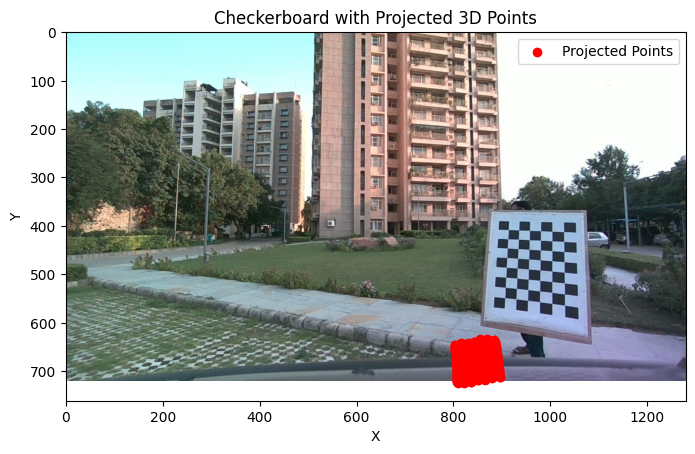

CV-A2-calibration\camera_parameters\frame_339.jpeg
frame_339.jpeg
(39, 1, 2)


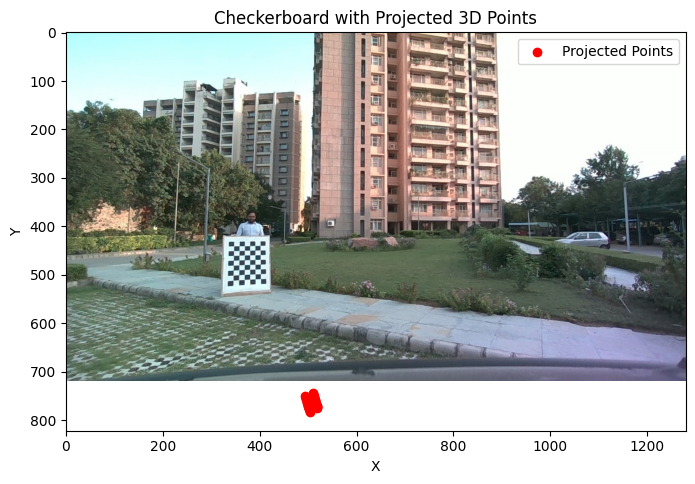

CV-A2-calibration\camera_parameters\frame_457.jpeg
frame_457.jpeg
(117, 1, 2)


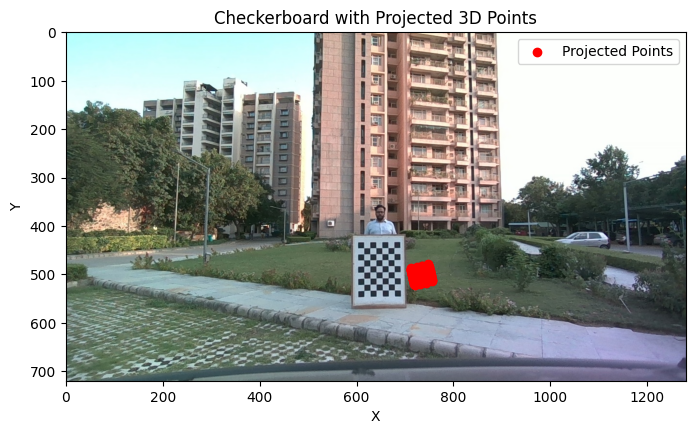

CV-A2-calibration\camera_parameters\frame_548.jpeg
frame_548.jpeg
(50, 1, 2)


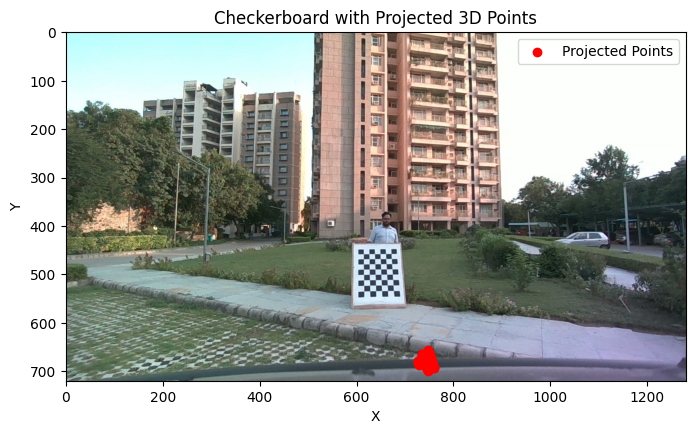

CV-A2-calibration\camera_parameters\frame_595.jpeg
frame_595.jpeg
(108, 1, 2)


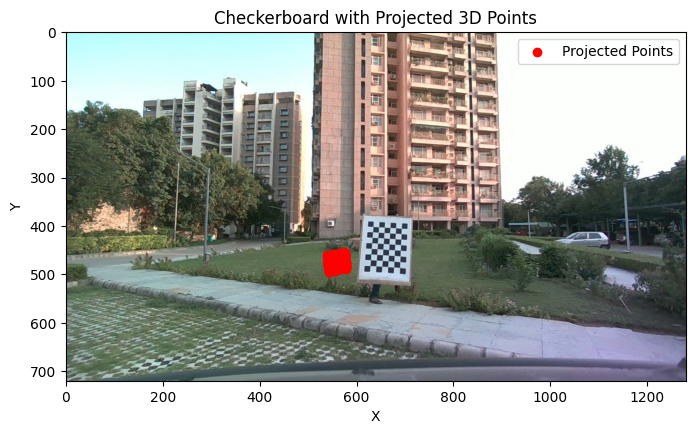

CV-A2-calibration\camera_parameters\frame_607.jpeg
frame_607.jpeg
(82, 1, 2)


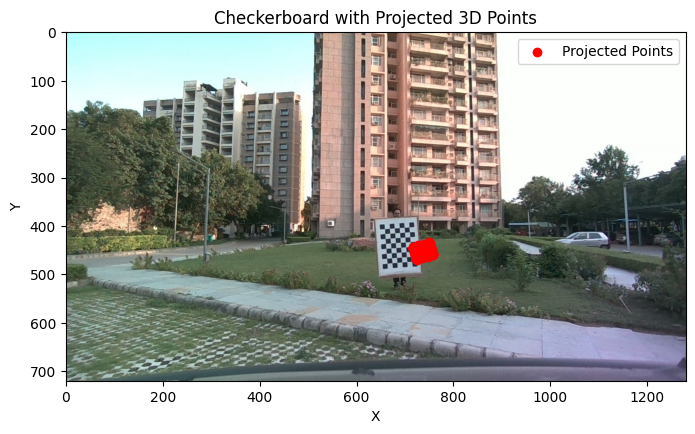

CV-A2-calibration\camera_parameters\frame_639.jpeg
frame_639.jpeg
(34, 1, 2)


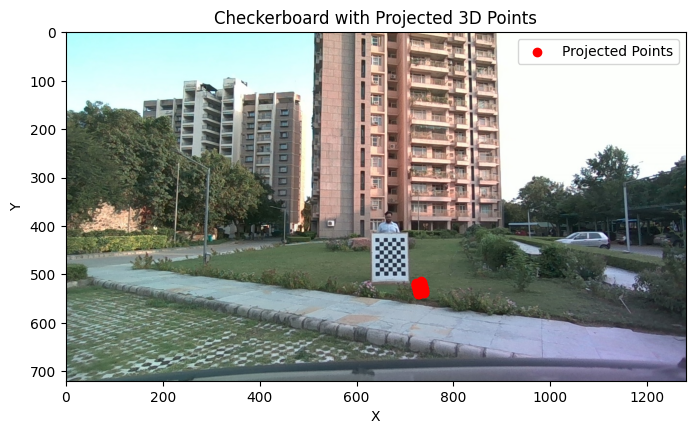

CV-A2-calibration\camera_parameters\frame_690.jpeg
frame_690.jpeg
(50, 1, 2)


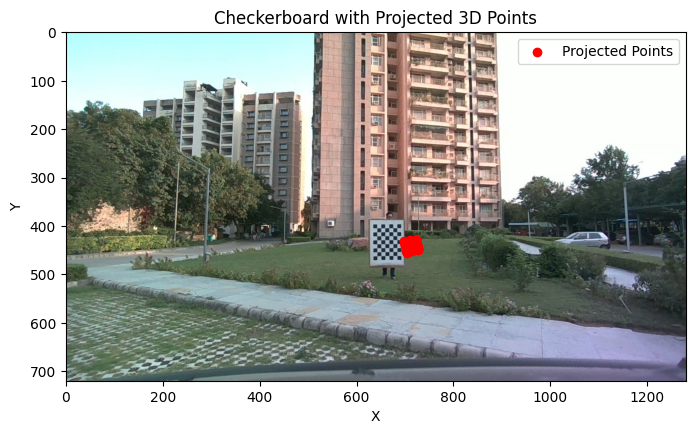

CV-A2-calibration\camera_parameters\frame_795.jpeg
frame_795.jpeg
(74, 1, 2)


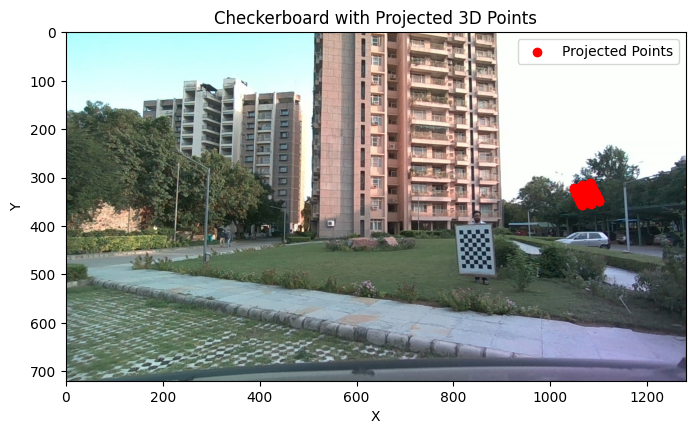

CV-A2-calibration\camera_parameters\frame_812.jpeg
frame_812.jpeg
(120, 1, 2)


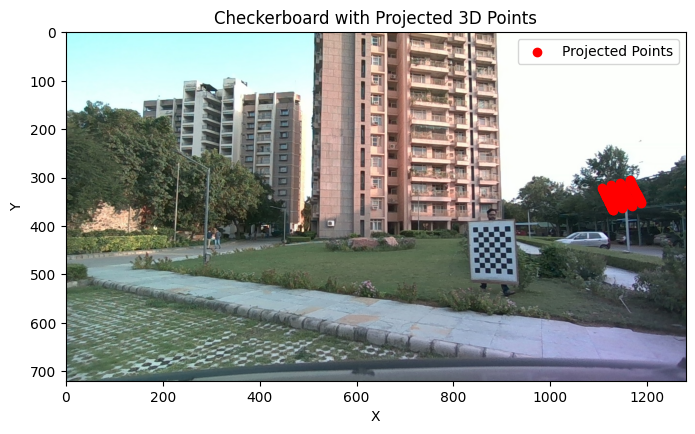

In [79]:
for i, path in enumerate(pcd_list):
    img_name = parameter_list[i].split("\\")[-1]
    rmatrix = []
    with open(f"{parameter_list[i]}//rotation_matrix.txt", 'r') as f:
        for line in f:
            rmatrix.append([eval(x) for x in line.split()])
    
    tmatrix = []
    with open(f"{parameter_list[i]}//translation_vectors.txt", 'r') as f:
        for line in f:
            tmatrix.append(eval(line.strip()))
    print(parameter_list[i])
    print(img_name)
    pcd = o3d.io.read_point_cloud(path)
    points = np.asarray(pcd.points)
    camera_points = []
    for point in points:
        temp = rotation_matrix @ point.reshape((3,1)) + translation_matrix
        camera_points.append(temp)
    camera_points = np.array(camera_points)
    point2d, _ = cv2.projectPoints(np.array(camera_points), np.array(rmatrix), np.array(tmatrix), intrinsic_parameter, None)
    print(point2d.shape)
    img_path = f"CV-A2-calibration\camera_images\{img_name}"
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8, 6))
    plt.imshow(image_rgb)
    plt.scatter(point2d[:, 0, 0], point2d[:, 0, 1], c='r', marker='o', label='Projected Points')
    # plt.gca().invert_yaxis()  # Invert y-axis to match OpenCV's coordinate system
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('Checkerboard with Projected 3D Points')
    plt.legend()
    plt.show()
    # break

No note all points are within the boundary, only in few cases. Although the orientation of the points matches the orintentaion of the chessboards.

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

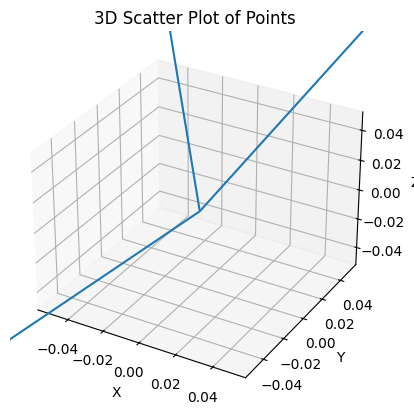

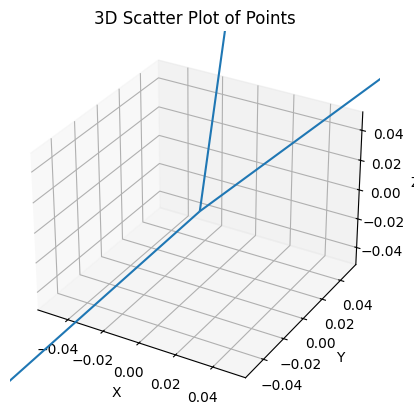

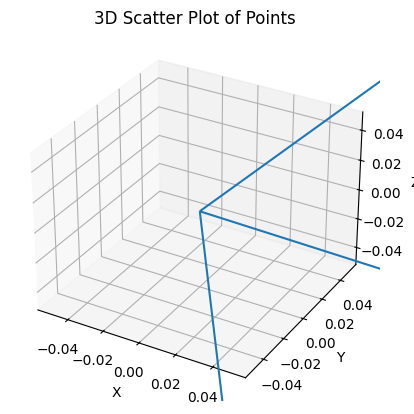

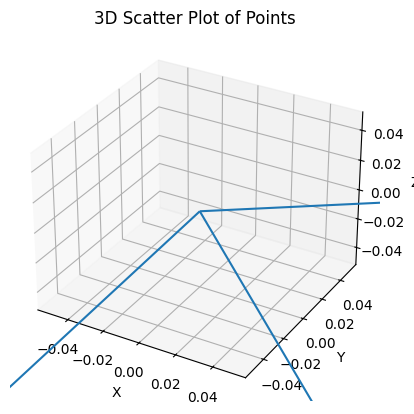

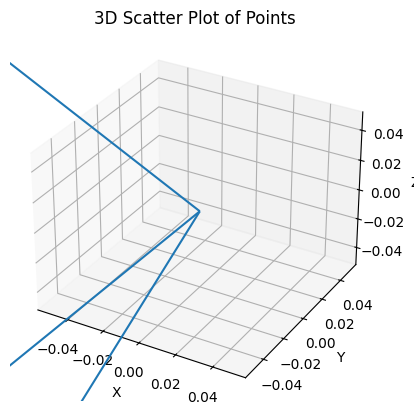

Mean Value:  0.047774845585794784
Std Deviation:  0.23597685443769204


In [87]:
err_list = []
img_list = []
for i in range(38):
    lidar_normal = np.array(normal_list[i])
    camera_normal = camera_normal_list[i]
    transformed_lidar_normal = np.array(rotation_matrix) @ np.array(lidar_normal)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.quiver(0, 0, 0, lidar_normal[0], lidar_normal[1], lidar_normal[2], arrow_length_ratio=0.1)
    ax.quiver(0, 0, 0, camera_normal[0], camera_normal[1],camera_normal[2], arrow_length_ratio=0.1)
    ax.quiver(0, 0, 0, transformed_lidar_normal[0], transformed_lidar_normal[1], transformed_lidar_normal[2], arrow_length_ratio=0.1)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('3D Scatter Plot of Points')
    plt.show()

    if(i==4):
        break
    cosine_distance = np.dot(lidar_normal.T, transformed_lidar_normal) / (np.linalg.norm(lidar_normal) * np.linalg.norm(transformed_lidar_normal))
    err_list.append(cosine_distance)
    img_list.append(parameter_list[i].split("\\")[-1])

mean_value = np.mean(err_list)
std_deviation = np.std(err_list)
print("Mean Value: ", mean_value)
print("Std Deviation: ", std_deviation)

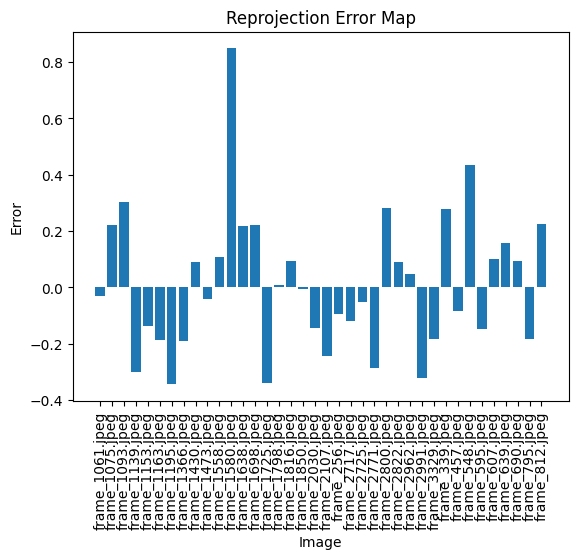

In [84]:
plt.bar(img_list, err_list)
plt.xticks(rotation=90)
plt.xlabel('Image')
plt.ylabel('Error')
plt.title('Reprojection Error Map')
plt.show()